## Defining the research question.
Identify the postal codes with the top 2 highest number of BlueCars rented on average and inform whether the difference, if any, is statistically significant.


## Success criteria


In [ ]:
pip install -U pandas-profiling

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
#Uploading the dataset
from google.colab import files
upload = files.upload()
upload2 = files.upload()

Saving autolib_daily_events_postal_code.csv to autolib_daily_events_postal_code.csv


Saving columns_explanation.xlsx to columns_explanation.xlsx


In [4]:
autolib = pd.read_csv('autolib_daily_events_postal_code.csv')
autolib.head()

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
0,75001,1/1/2018,1440,0,weekday,110,103,3,2,10,9,22,20
1,75001,1/2/2018,1438,1,weekday,98,94,1,1,8,8,23,22
2,75001,1/3/2018,1439,2,weekday,138,139,0,0,2,2,27,27
3,75001,1/4/2018,1320,3,weekday,104,104,2,2,9,8,25,21
4,75001,1/5/2018,1440,4,weekday,114,117,3,3,6,6,18,20


In [5]:
#checking dataset shape 
autolib.shape

(16085, 13)

In [6]:
#checking column names
autolib.columns

Index(['Postal code', 'date', 'n_daily_data_points', 'dayOfWeek', 'day_type',
       'BlueCars_taken_sum', 'BlueCars_returned_sum', 'Utilib_taken_sum',
       'Utilib_returned_sum', 'Utilib_14_taken_sum', 'Utilib_14_returned_sum',
       'Slots_freed_sum', 'Slots_taken_sum'],
      dtype='object')

In [7]:
#a description of the column names
description = pd.read_excel('columns_explanation.xlsx')
description

,Column name,explanation
0,Postal code,postal code of the area (in Paris)
1,date,date of the row aggregation
2,n_daily_data_points,number of daily data points that were availabl...
3,dayOfWeek,identifier of weekday (0: Monday -> 6: Sunday)
4,day_type,weekday or weekend
5,BlueCars_taken_sum,Number of bluecars taken that date in that area
6,BlueCars_returned_sum,Number of bluecars returned that date in that ...
7,Utilib_taken_sum,Number of Utilib taken that date in that area
8,Utilib_returned_sum,Number of Utilib returned that date in that area
9,Utilib_14_taken_sum,Number of Utilib 1.4 taken that date in that area


In [8]:
#checking column data types
autolib.dtypes

Postal code                int64
date                      object
n_daily_data_points        int64
dayOfWeek                  int64
day_type                  object
BlueCars_taken_sum         int64
BlueCars_returned_sum      int64
Utilib_taken_sum           int64
Utilib_returned_sum        int64
Utilib_14_taken_sum        int64
Utilib_14_returned_sum     int64
Slots_freed_sum            int64
Slots_taken_sum            int64
dtype: object

In [9]:
#checking null values
autolib.isna().sum()

Postal code               0
date                      0
n_daily_data_points       0
dayOfWeek                 0
day_type                  0
BlueCars_taken_sum        0
BlueCars_returned_sum     0
Utilib_taken_sum          0
Utilib_returned_sum       0
Utilib_14_taken_sum       0
Utilib_14_returned_sum    0
Slots_freed_sum           0
Slots_taken_sum           0
dtype: int64

In [10]:
autolib.describe()

,Postal code,n_daily_data_points,dayOfWeek,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
count,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000,16085.000000
mean,88791.293876,1431.330619,2.969599,125.926951,125.912714,3.698290,3.699099,8.600560,8.599192,22.629033,22.629282
std,7647.342000,33.212050,2.008378,185.426579,185.501535,5.815058,5.824634,12.870098,12.868993,52.120263,52.146030
min,75001.000000,1174.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,91330.000000,1439.000000,1.000000,20.000000,20.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,92340.000000,1440.000000,3.000000,46.000000,46.000000,1.000000,1.000000,3.000000,3.000000,0.000000,0.000000
75%,93400.000000,1440.000000,5.000000,135.000000,135.000000,4.000000,4.000000,10.000000,10.000000,5.000000,5.000000
max,95880.000000,1440.000000,6.000000,1352.000000,1332.000000,54.000000,58.000000,100.000000,101.000000,360.000000,359.000000


## Data Cleaning

In [11]:
#changing date column to datetime data type
autolib['date'] = autolib['date'].astype('datetime64[ns]')
autolib.dtypes

Postal code                        int64
date                      datetime64[ns]
n_daily_data_points                int64
dayOfWeek                          int64
day_type                          object
BlueCars_taken_sum                 int64
BlueCars_returned_sum              int64
Utilib_taken_sum                   int64
Utilib_returned_sum                int64
Utilib_14_taken_sum                int64
Utilib_14_returned_sum             int64
Slots_freed_sum                    int64
Slots_taken_sum                    int64
dtype: object

In [12]:
autolib.columns = ['Postal code', 'date', 'n_daily_data_points', 'Day', 'day_type',
       'BlueCars_taken_sum', 'BlueCars_returned_sum', 'Utilib_taken_sum',
       'Utilib_returned_sum', 'Utilib_14_taken_sum', 'Utilib_14_returned_sum',
       'Slots_freed_sum', 'Slots_taken_sum']

## Performing Exploratory Data Analysis



In [13]:
from pandas_profiling import ProfileReport
prof = ProfileReport(autolib, title='Autolib Dataset Profile Report')
prof

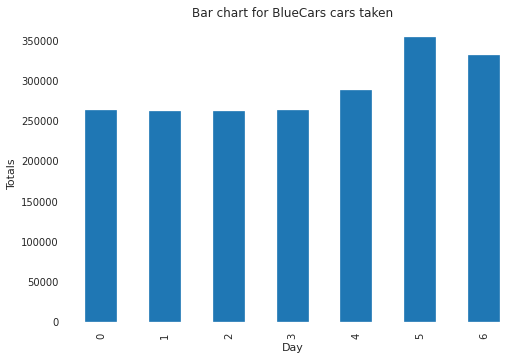

In [14]:
#Grouping data by day
day_groups = autolib.groupby(['Day']).sum()
day_groups['BlueCars_taken_sum'].plot.bar()
plt.title('Bar chart for BlueCars cars taken')
plt.ylabel('Totals')
plt.show()

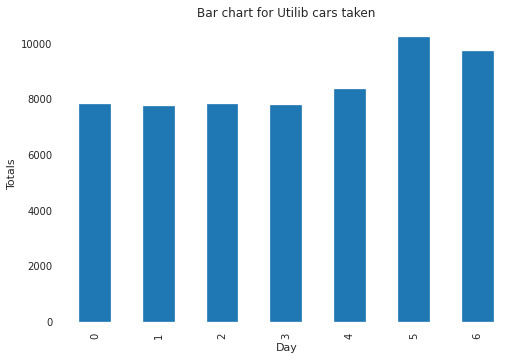

In [15]:
#plotting bar chart for utilib
day_groups['Utilib_taken_sum'].plot.bar()
plt.title('Bar chart for Utilib cars taken')
plt.ylabel('Totals')
plt.show()

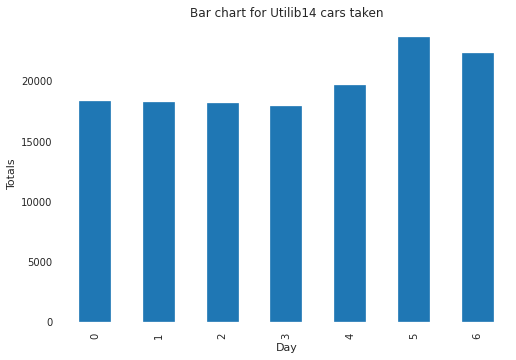

In [16]:
#plotting bar chart for utilib14
day_groups['Utilib_14_taken_sum'].plot.bar()
plt.title('Bar chart for Utilib14 cars taken')
plt.ylabel('Totals')
plt.show()

In [17]:
#checking postal code with highest sum of BlueCars taken
postal_groups = autolib.drop('Day', axis=1).groupby(['Postal code']).sum().reset_index()
postal_groups.iloc[postal_groups['BlueCars_taken_sum'].idxmax()]

Postal code                75015
n_daily_data_points       223281
BlueCars_taken_sum        139925
BlueCars_returned_sum     139943
Utilib_taken_sum            3798
Utilib_returned_sum         3798
Utilib_14_taken_sum         9613
Utilib_14_returned_sum      9612
Slots_freed_sum            37271
Slots_taken_sum            37298
Name: 14, dtype: int64

In [18]:
#checking postal code with least sum of BlueCars taken
postal_groups.iloc[postal_groups['BlueCars_taken_sum'].idxmin()]

Postal code                93390
n_daily_data_points       120431
BlueCars_taken_sum           305
BlueCars_returned_sum        302
Utilib_taken_sum               6
Utilib_returned_sum            6
Utilib_14_taken_sum           19
Utilib_14_returned_sum        19
Slots_freed_sum                0
Slots_taken_sum                0
Name: 77, dtype: int64

In [19]:
#checking postal code with highest sum of Utilib taken
postal_groups.iloc[postal_groups['Utilib_taken_sum'].idxmax()]

Postal code                75015
n_daily_data_points       223281
BlueCars_taken_sum        139925
BlueCars_returned_sum     139943
Utilib_taken_sum            3798
Utilib_returned_sum         3798
Utilib_14_taken_sum         9613
Utilib_14_returned_sum      9612
Slots_freed_sum            37271
Slots_taken_sum            37298
Name: 14, dtype: int64

In [20]:
#checking postal code with least sum of Utilib taken
postal_groups.iloc[postal_groups['Utilib_taken_sum'].idxmin()]

Postal code                93390
n_daily_data_points       120431
BlueCars_taken_sum           305
BlueCars_returned_sum        302
Utilib_taken_sum               6
Utilib_returned_sum            6
Utilib_14_taken_sum           19
Utilib_14_returned_sum        19
Slots_freed_sum                0
Slots_taken_sum                0
Name: 77, dtype: int64

In [21]:
#checking postal code with highest sum of Utilib14 taken
postal_groups.iloc[postal_groups['Utilib_14_taken_sum'].idxmax()]

Postal code                75015
n_daily_data_points       223281
BlueCars_taken_sum        139925
BlueCars_returned_sum     139943
Utilib_taken_sum            3798
Utilib_returned_sum         3798
Utilib_14_taken_sum         9613
Utilib_14_returned_sum      9612
Slots_freed_sum            37271
Slots_taken_sum            37298
Name: 14, dtype: int64

In [22]:
#checking postal code with least sum of Utilib14 taken
postal_groups.iloc[postal_groups['Utilib_14_taken_sum'].idxmin()]

Postal code                93390
n_daily_data_points       120431
BlueCars_taken_sum           305
BlueCars_returned_sum        302
Utilib_taken_sum               6
Utilib_returned_sum            6
Utilib_14_taken_sum           19
Utilib_14_returned_sum        19
Slots_freed_sum                0
Slots_taken_sum                0
Name: 77, dtype: int64

In [23]:
#checking postal code with highest sum of slots freed
postal_groups.iloc[postal_groups['Slots_freed_sum'].idxmax()]

Postal code                75015
n_daily_data_points       223281
BlueCars_taken_sum        139925
BlueCars_returned_sum     139943
Utilib_taken_sum            3798
Utilib_returned_sum         3798
Utilib_14_taken_sum         9613
Utilib_14_returned_sum      9612
Slots_freed_sum            37271
Slots_taken_sum            37298
Name: 14, dtype: int64

In [24]:
#checking postal code with least sum of slots freed
postal_groups.iloc[postal_groups['Slots_freed_sum'].idxmin()]

Postal code                78000
n_daily_data_points       223281
BlueCars_taken_sum          7113
BlueCars_returned_sum       7089
Utilib_taken_sum             226
Utilib_returned_sum          228
Utilib_14_taken_sum          486
Utilib_14_returned_sum       490
Slots_freed_sum                0
Slots_taken_sum                0
Name: 22, dtype: int64

## Univariate Analysis Summary
The data set contains time-series data which spans 1st January 2018, to 19th June 2018, a total of 156 days.  Since the data was based on time,  data was collected from all days within this period barring the final week where data was collected on Monday and Tuesday only.  Out of all the days whose data was recorded, there were 11,544 records collected on weekdays, and 4541 records collected on weekends amounting to 16085 records for all postal areas. There are 104 unique postal codes highlighting the areas that the data covers. For each of the postal areas, data has been collected uniformly across the 156 days used in collecting this data. 

For the duration covered by the dataset, the average number of BlueCars taken is 125.93 with 125.91 returned. For the Utilib and Utilib14 cars, the average number of cars taken was 3.70 and 8.60 with a similar average number of cars returned. The standard deviation for the sum of taken BlueCars, Utilib, and Utilib14 was 185.42, 5.81, and 12.87 respectively.

## Bivariate Analysis Summary
For the Bivariate analysis, I examined the frequency at which different cars were taken across diffrent days.I identified Wednesday as having had the least number of BlueCars taken on weekday while Friday had the highest. Over the weekends, Saturday registered the greater number BlueCars taken compared to Sunday. Overall, it was evident that weekends were busier than the weekdays. A similar pattern of busy weekends was evidenced by Utilib and Utilib14 with Tuesday and Friday for Utilib, and Thursday and Friday for Utilib14, recording the lowest, and highest totals respectively. Saturday recorded the highest totals for both cars followed by Sunday over the weekends and overall.
 
While exploring the different areas, postal code 75015 and 93390 were the areas that recorded the highest and the least number of BlueCars, Utilib, and Utilib14 cars taken over the duration covered by the study.
I also explored collinearity in the dataset where I noticed high multicolinearity as evidenced by the profile warning report and the correlation matrix heat map. The BlueCars returned is highly correlated with the BlueCars taken, Utilib14 taken and returned and the number of slots freed or taken at any given time. The high correlation was also evident between the number of Utilib14 cars and BlueCars, while the sum of slots freed had high correlation with the number of BlueCars. The number of Utilib cars taken had only had a high correlation with number of Utilib cars returned.  A deeper understanding of the correlations can be observed on the correlation heat map.

## Hypothesis Testing

In [25]:
#Splitting the dataset into weekdays and weekends
autolib_weekdays = autolib[autolib['day_type']== 'weekday']
autolib_weekends = autolib[autolib['day_type']== 'weekend']
print(autolib_weekdays.shape)
print(autolib_weekends.shape)

(11544, 13)
(4541, 13)


In [26]:
#checking postal code with highest sum of BlueCars taken
autolib_postal_grps = pd.pivot_table(autolib_weekdays, values=['BlueCars_taken_sum'],
                    columns=['Postal code'], aggfunc=np.sum).transpose().sort_values(by='BlueCars_taken_sum', ascending=False)
autolib_postal_grps.head(10)

,BlueCars_taken_sum
Postal code,
75015,92723
75016,84289
75017,78016
75013,55558
75019,51964
75014,49818
75011,49367
75012,49345
75008,49272


In [27]:
#splitting the datset into weekday and weekends for the two postal codes
weekdays_top_code = autolib_weekdays[autolib_weekdays['Postal code'] == 75015 ]
weekdays_second_code = autolib_weekdays[autolib_weekdays['Postal code'] == 75016 ]

weekends_top_code = autolib_weekends[autolib_weekends['Postal code'] == 75015 ]
weekends_second_code = autolib_weekends[autolib_weekends['Postal code'] == 75016 ]

,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2339,75015,2018-06-19,1370,1,weekday,49,52,3,1,2,6,7,8


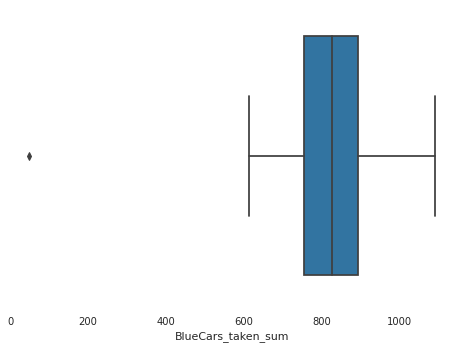

In [28]:
#Check T-test assumptions
#Checking for outliers
sns.boxplot(weekdays_top_code['BlueCars_taken_sum'])
plt.title('Sum of BlueCars taken on weekdays')

q1_top, q3_top = np.percentile(weekdays_top_code['BlueCars_taken_sum'], [25, 75])
iqr_top = q3_top - q1_top
lower_bound_top = q1_top - (1.5 * iqr_top)
weekdays_top_code[weekdays_top_code['BlueCars_taken_sum'] < lower_bound_top]

,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2341,75016,2018-01-02,1438,1,weekday,536,536,8,9,46,47,128,126
2495,75016,2018-06-19,1370,1,weekday,36,40,4,2,6,6,15,12


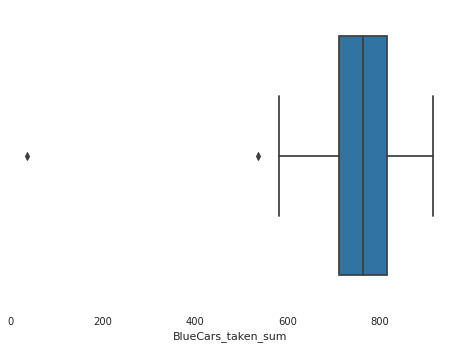

In [29]:
#Checking for outliers
sns.boxplot(weekdays_second_code['BlueCars_taken_sum'])

q1_second, q3_second = np.percentile(weekdays_second_code['BlueCars_taken_sum'], [25, 75])
iqr_second = q3_second - q1_second
lower_bound_second = q1_second - (1.5 * iqr_second)
weekdays_second_code[weekdays_second_code['BlueCars_taken_sum'] < lower_bound_top]

,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2238,75015,2018-02-24,1396,5,weekend,58,93,1,4,4,5,22,24
2309,75015,2018-05-20,1440,6,weekend,625,614,16,15,72,73,162,173


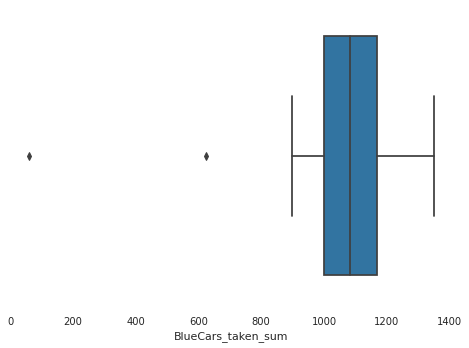

In [30]:
#Checking for outliers
sns.boxplot(weekends_top_code['BlueCars_taken_sum'])

q1_top, q3_top = np.percentile(weekends_top_code['BlueCars_taken_sum'], [25, 75])
iqr_top = q3_top - q1_top
lower_bound_top = q1_top - (1.5 * iqr_top)
weekends_top_code[weekends_top_code['BlueCars_taken_sum'] < lower_bound_top]

,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2394,75016,2018-02-24,1396,5,weekend,49,60,1,1,4,5,11,7
2465,75016,2018-05-20,1440,6,weekend,515,533,7,9,30,40,143,154


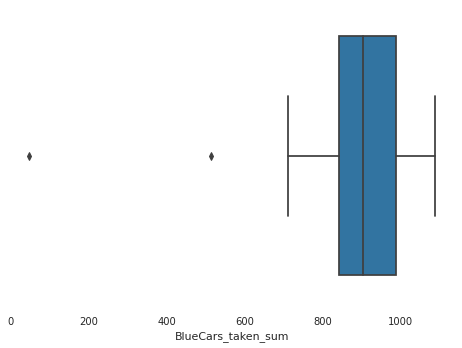

In [31]:
#Checking for outliers
sns.boxplot(weekends_second_code['BlueCars_taken_sum'])

q1_second, q3_second = np.percentile(weekends_second_code['BlueCars_taken_sum'], [25, 75])
iqr_second = q3_second - q1_second
lower_bound_second = q1_second - (1.5 * iqr_second)
weekends_second_code[weekends_second_code['BlueCars_taken_sum'] < lower_bound_second]

To maintain consistency in the dataset, I will drop all rows whose collection date has an outlier in the sum of BlueCars taken from both postal code groups. 

In [32]:
#removing weekday outliers
weekdays_top_code = weekdays_top_code.drop(weekdays_top_code[weekdays_top_code['date'] == '2018-01-02' ].index)
weekdays_top_code = weekdays_top_code.drop(weekdays_top_code[weekdays_top_code['date'] == '2018-06-19' ].index)
weekdays_second_code = weekdays_second_code.drop(weekdays_second_code[weekdays_second_code['date'] == '2018-01-02' ].index)
weekdays_second_code = weekdays_second_code.drop(weekdays_second_code[weekdays_second_code['date'] == '2018-06-19' ].index)

#removing weekend outliers
weekends_top_code = weekends_top_code.drop(weekends_top_code[weekends_top_code['date'] == '2018-02-24' ].index)
weekends_top_code = weekends_top_code.drop(weekends_top_code[weekends_top_code['date'] == '2018-05-20' ].index)
weekends_second_code = weekends_second_code.drop(weekends_second_code[weekends_second_code['date'] == '2018-02-24' ].index)
weekends_second_code = weekends_second_code.drop(weekends_second_code[weekends_second_code['date'] == '2018-05-20' ].index)

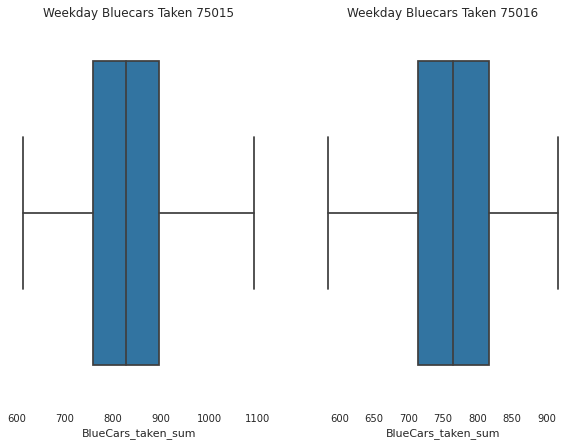

In [33]:
#Confirming no outliers on weekdays
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,7), sharey=True)

sns.boxplot(weekdays_top_code['BlueCars_taken_sum'], ax=ax1)
ax1.set_title('Weekday Bluecars Taken 75015')

sns.boxplot(weekdays_second_code['BlueCars_taken_sum'], ax=ax2)
ax2.set_title('Weekday Bluecars Taken 75016')

plt.show()


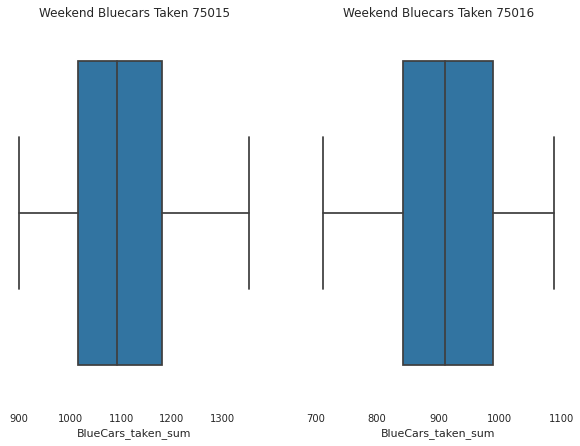

In [34]:
#confirming no outliers on weekends
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,7), sharey=True)

sns.boxplot(weekends_top_code['BlueCars_taken_sum'], ax=ax1)
ax1.set_title('Weekend Bluecars Taken 75015')

sns.boxplot(weekends_second_code['BlueCars_taken_sum'], ax=ax2)
ax2.set_title('Weekend Bluecars Taken 75016')

plt.show()

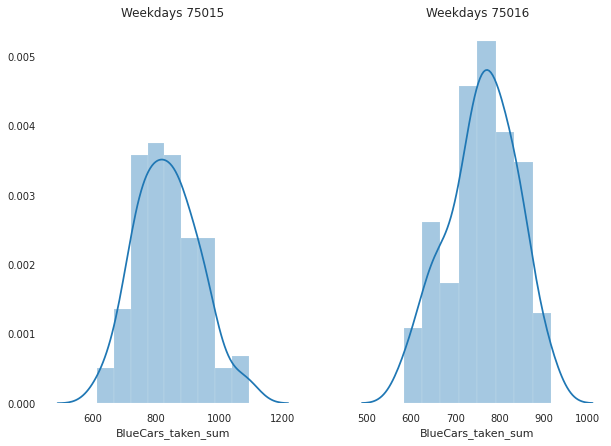

In [35]:
#checking for normality of weekday data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,7), sharey=True)
sns.distplot(weekdays_top_code['BlueCars_taken_sum'], ax=ax1)
ax1.set_title('Weekdays 75015')
sns.distplot(weekdays_second_code['BlueCars_taken_sum'], ax=ax2)
ax2.set_title('Weekdays 75016')
plt.show()

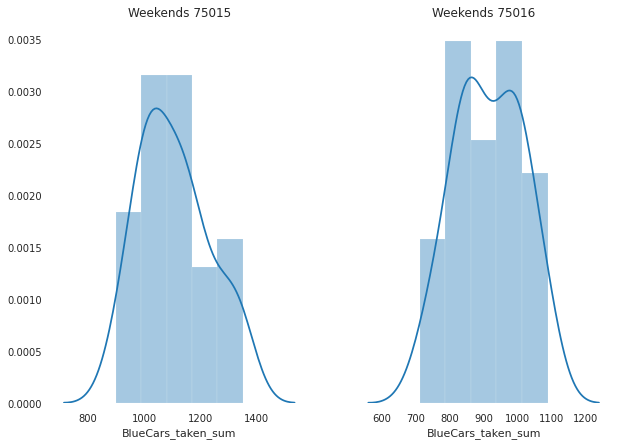

In [36]:
#checking for normality of weekend data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,7), sharey=True)
sns.distplot(weekends_top_code['BlueCars_taken_sum'], ax=ax1)
ax1.set_title('Weekends 75015')
sns.distplot(weekends_second_code['BlueCars_taken_sum'], ax=ax2)
ax2.set_title('Weekends 75016')
plt.show()

In [37]:
# Check for equal variance in weekday data
from scipy.stats import levene
stat, p1 = levene(weekdays_top_code['BlueCars_taken_sum'], weekdays_second_code['BlueCars_taken_sum'])
stat, p2 = levene(weekends_top_code['BlueCars_taken_sum'], weekends_second_code['BlueCars_taken_sum'])
print('weekday data p_value:',p1 ,'and ','weekend data p_value:',p2)

weekday data p_value: 0.010750161081262616 and  weekend data p_value: 0.17601190775517844


The weekday data has a p-value of 0.01075 which is lower than 0.05 indicating that they have different variances. The weekend data, on the other hand, has a p-value of 0.1760 which is higher than 0.05 indicating that the data sets have equal variance.


Text(0.5, 1.0, 'Line Graph for BlueCars taken over time')

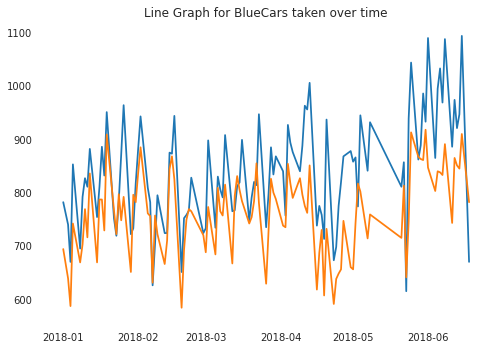

In [38]:
#checking for trends in the data before sampling to avoid bias
y1 = weekdays_top_code['BlueCars_taken_sum']
y2 = weekdays_second_code['BlueCars_taken_sum']
x = weekdays_top_code['date']

plt.plot(x,y1)
plt.plot(x,y2)
plt.title('Line Graph for BlueCars taken over time')

In [49]:
#Sampling the dataset
sample_top_weekdays = weekdays_top_code.groupby('Day', group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.2))
sample_top_weekdays.Day.value_counts()

0    5
4    4
3    4
2    4
1    4
Name: Day, dtype: int64

In [50]:
#Sampling the dataset
sample_second_weekdays = weekdays_second_code.groupby('Day', group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.2))
sample_second_weekdays.Day.value_counts()

0    5
4    4
3    4
2    4
1    4
Name: Day, dtype: int64

In [51]:
#Sampling the dataset
sample_second_weekends = weekends_second_code.groupby('Day', group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.2))
print(sample_second_weekends.Day.value_counts())
sample_second_weekends

6    4
5    4
Name: Day, dtype: int64


,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2387,75016,2018-02-17,1440,5,weekend,953,954,20,19,66,67,253,255
2440,75016,2018-04-14,1440,5,weekend,931,915,21,19,58,59,222,222
2433,75016,2018-04-07,1318,5,weekend,1020,1010,41,42,51,52,225,225
2461,75016,2018-05-05,1440,5,weekend,1088,1064,22,19,48,55,283,275
2367,75016,2018-01-28,1440,6,weekend,847,890,28,26,80,77,205,210
2374,75016,2018-02-04,1440,6,weekend,905,970,14,19,51,55,214,215
2353,75016,2018-01-14,1440,6,weekend,918,940,18,18,60,61,274,268
2493,75016,2018-06-17,1440,6,weekend,845,873,25,23,85,73,209,200


In [52]:
#Sampling the dataset
sample_top_weekends = weekends_top_code.groupby('Day', group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.2))
print(sample_top_weekends.Day.value_counts())
sample_top_weekends

6    4
5    4
Name: Day, dtype: int64


,Postal code,date,n_daily_data_points,Day,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
2315,75015,2018-05-26,1440,5,weekend,1335,1276,36,33,78,73,339,336
2291,75015,2018-04-21,1440,5,weekend,1023,1017,28,29,58,58,226,220
2224,75015,2018-02-10,1440,5,weekend,1118,1136,32,35,68,70,319,330
2203,75015,2018-01-20,1439,5,weekend,1352,1300,38,36,75,71,302,295
2197,75015,2018-01-14,1440,6,weekend,1097,1135,27,28,82,84,286,286
2232,75015,2018-02-18,1438,6,weekend,1037,1072,54,58,50,50,272,263
2292,75015,2018-04-22,1440,6,weekend,925,979,24,28,45,49,222,231
2337,75015,2018-06-17,1440,6,weekend,1001,1090,35,41,44,50,225,244


In [53]:
#computing p-value for weekday sample data
from scipy import stats
stat_weekday, p_weekday = stats.ttest_ind(sample_top_weekdays['BlueCars_taken_sum'], sample_second_weekdays['BlueCars_taken_sum'], equal_var=False)
stat_weekday, p_weekday

(3.315401715378344, 0.001986882862449969)

At 5% significance level, we reject the null hypothesis that the samples have equal means and accept the alternate hypothesis that sample means are significantly different. This means that the frequency at which BlueCars are taken during the weekends in postal area 75015 is significantly higher than those in 75016.

In [54]:
#computing p-value for weekend sample data
stat_weekend, p_weekend = stats.ttest_ind(sample_top_weekends['BlueCars_taken_sum'], sample_second_weekends['BlueCars_taken_sum'], equal_var=True)
stat_weekend, p_weekend

(2.7773808731684624, 0.014825538450533306)

At 5% significance level, we reject the null hypothesis that the samples have equal means and accept the alternate hypothesis that sample means are significantly different. This means that the frequency at which BlueCars are taken during the weekends in postal area 75015 is significantly higher than those in 75016.

In [55]:
#computing point estimate for weekend mean difference
xbar1, xbar2 = sample_top_weekdays['BlueCars_taken_sum'].mean(), sample_second_weekdays['BlueCars_taken_sum'].mean()
point_estimate = xbar1 - xbar2
point_estimate

90.47619047619048

In [56]:
#computing confidence interval for the population's weekday mean difference
import statsmodels.stats.api as sms

X1, X2 = sample_top_weekdays['BlueCars_taken_sum'], sample_second_weekdays['BlueCars_taken_sum']

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(alpha=0.05, alternative='two-sided', usevar='unequal'))

(35.27578665906, 145.67659429332096)


From a sample size of 0.4 of the entire dataset,we can be 95% certain that the difference between the population means of postal code 75015 and 75016 is between 28.62 and 111.79.

From a sample size of 0.2 of the entire dataset,we can be 95% certain that the difference between the population means of postal code 75015 and 75016 is between 35.27 and 145.68.

In [57]:
#computing point estimate for weekend mean difference
xbar1, xbar2 = sample_top_weekends['BlueCars_taken_sum'].mean(), sample_second_weekends['BlueCars_taken_sum'].mean()
point_estimate = xbar1 - xbar2
point_estimate

172.625

In [58]:
#computing confidence interval for the population's weekend mean difference
import statsmodels.stats.api as sms

X1, X2 = sample_top_weekends['BlueCars_taken_sum'], sample_second_weekends['BlueCars_taken_sum']

cm = sms.CompareMeans(sms.DescrStatsW(X1), sms.DescrStatsW(X2))
print(cm.tconfint_diff(alpha=0.05, alternative='two-sided',usevar='pooled'))

(39.318183647051626, 305.9318163529484)


From a sample size of 0.4 of the entire dataset,we can be 95% certain that the difference between the population means of postal code 75015 and 75016 is between 101.52 and 259.22.

From a sample size of 0.2 of the entire dataset,we can be 95% certain that the difference between the population means of postal code 75015 and 75016 is between 39.32 and 305.93.